In [1]:
import os
import math
import random

import numpy as np
import tensorflow as tf
import cv2

slim = tf.contrib.slim

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [3]:
import sys
sys.path.insert(0,'../')

In [4]:
from nets import ssd_common, np_methods
from preprocessing import ssd_vgg_preprocessing
from notebooks import visualization

In [5]:
from preprocessing import ssd_vgg_preprocessing

In [6]:
# TensorFlow session: grow memory when needed. TF, DO NOT USE ALL MY GPU MEMORY!!!
gpu_options = tf.GPUOptions(allow_growth=True)
config = tf.ConfigProto(log_device_placement=False, gpu_options=gpu_options)
isess = tf.InteractiveSession(config=config)

## SSD 300 Model

The SSD 300 network takes 300x300 image inputs. In order to feed any image, the latter is resize to this input shape (i.e.`Resize.WARP_RESIZE`). Note that even though it may change the ratio width / height, the SSD model performs well on resized images (and it is the default behaviour in the original Caffe implementation).

SSD anchors correspond to the default bounding boxes encoded in the network. The SSD net output provides offset on the coordinates and dimensions of these anchors.

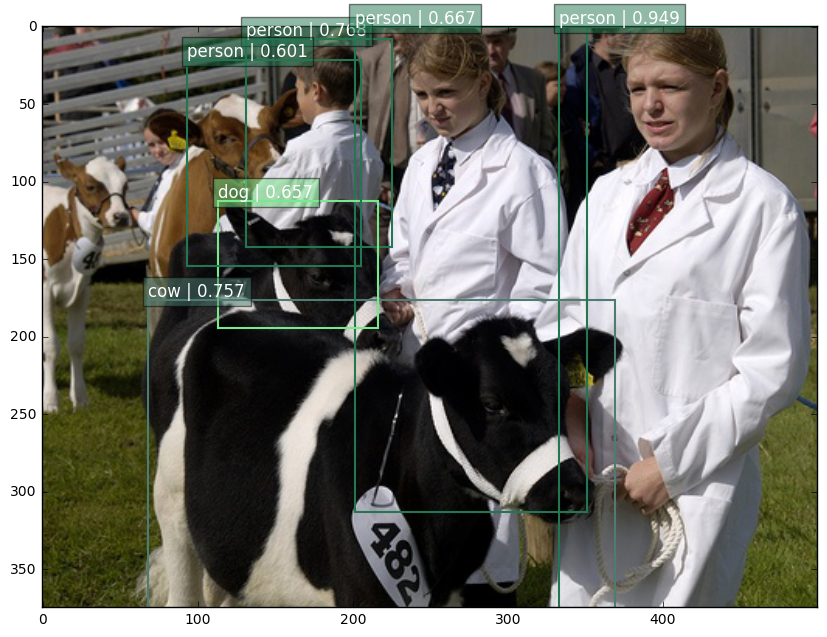

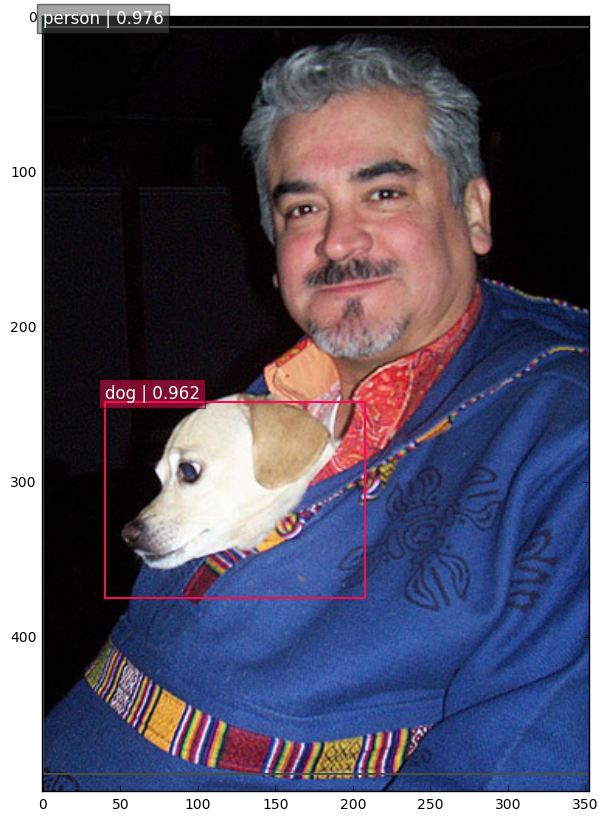

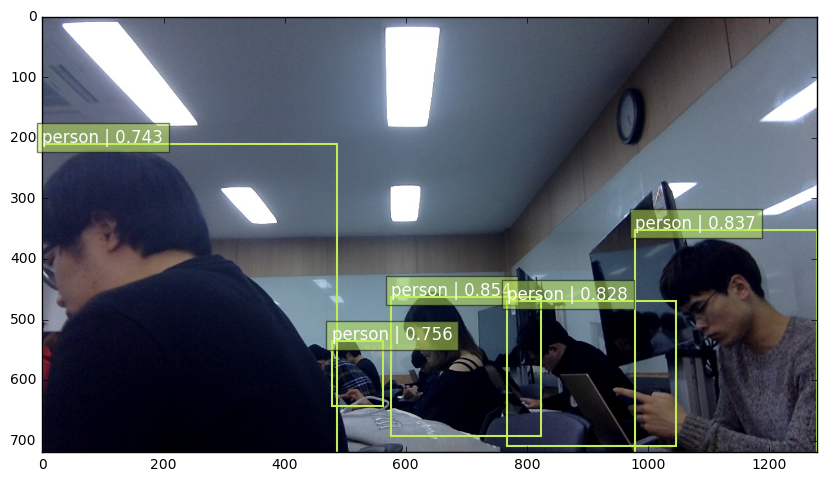

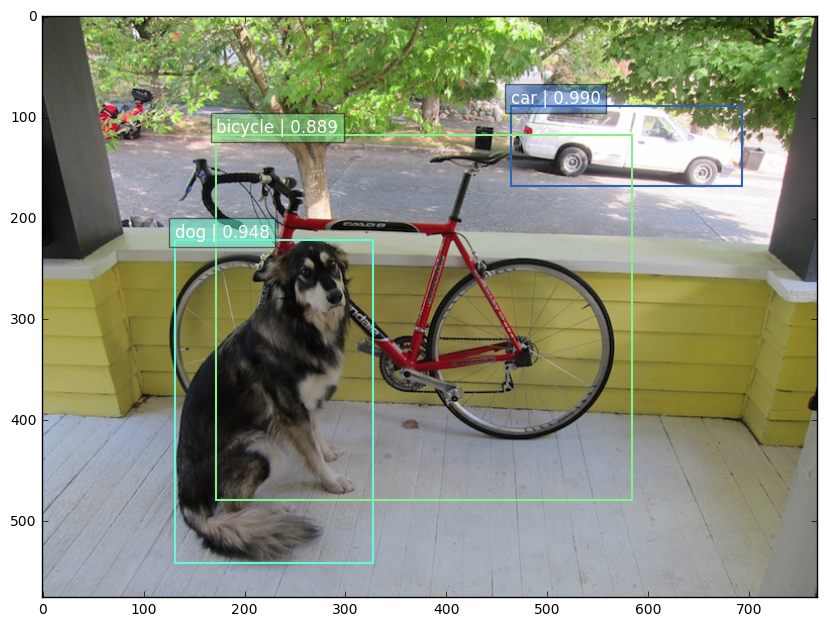

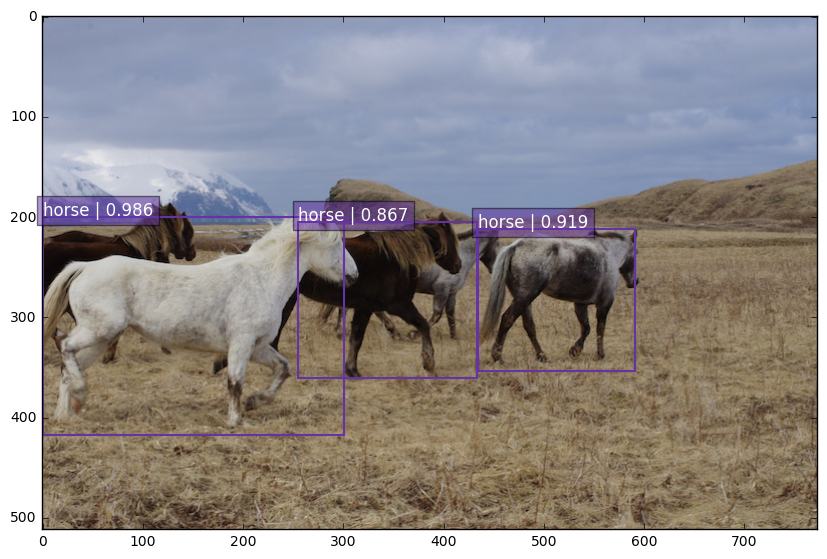

...

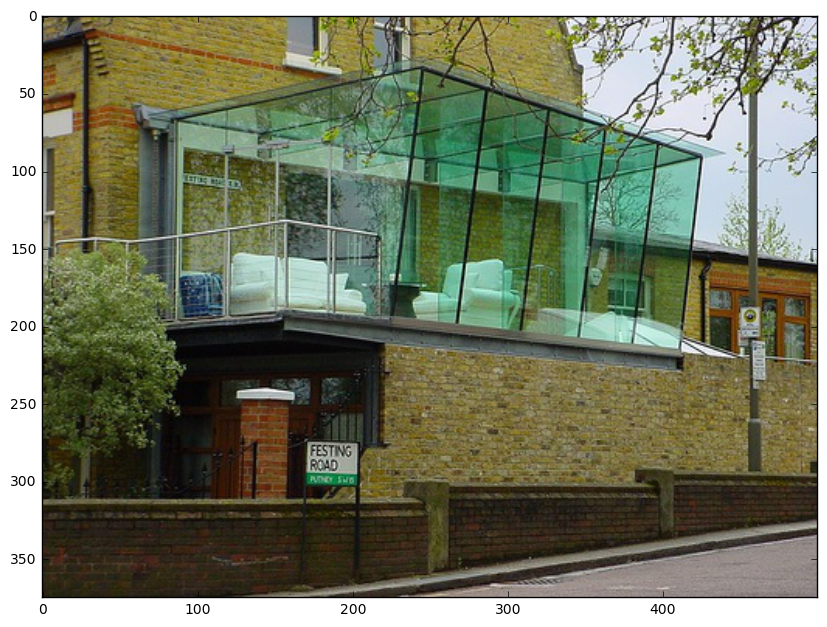

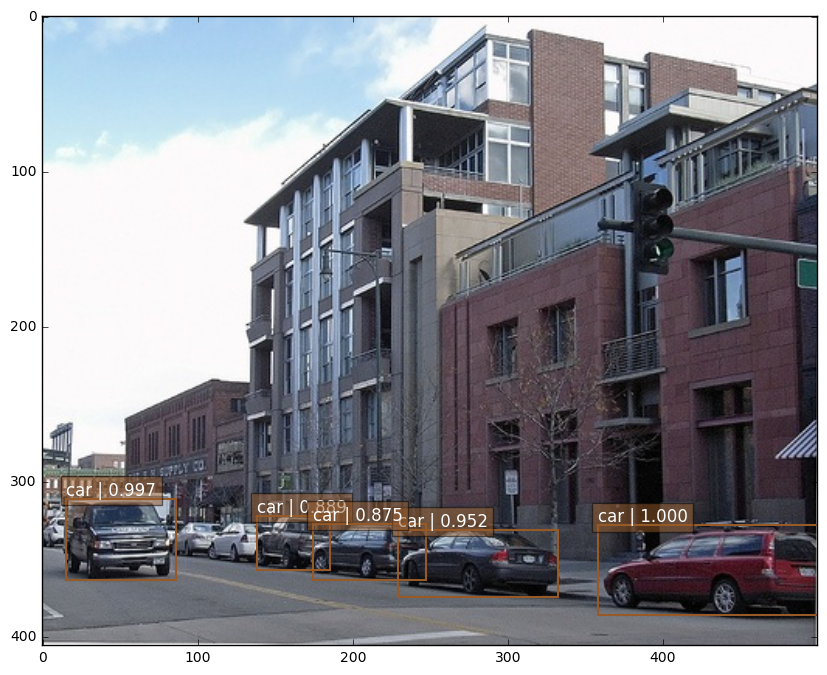

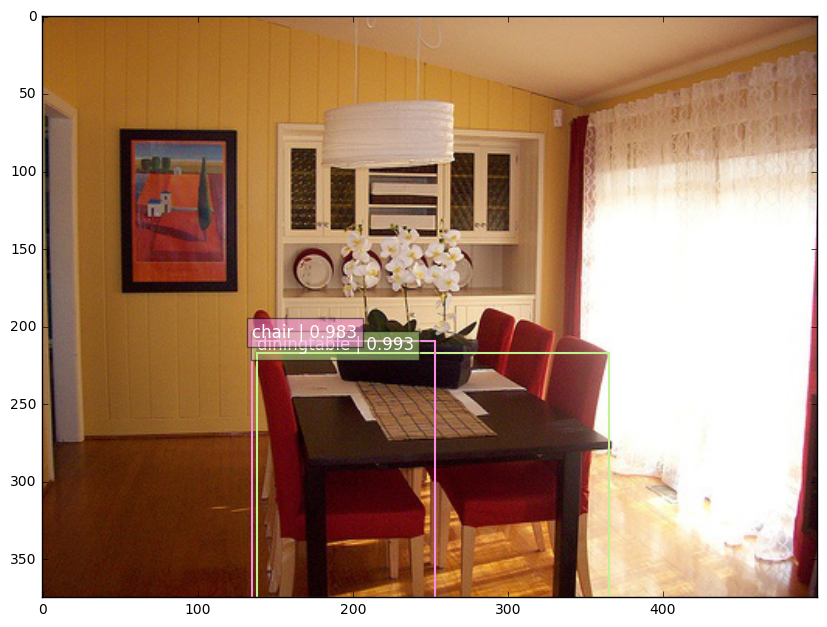

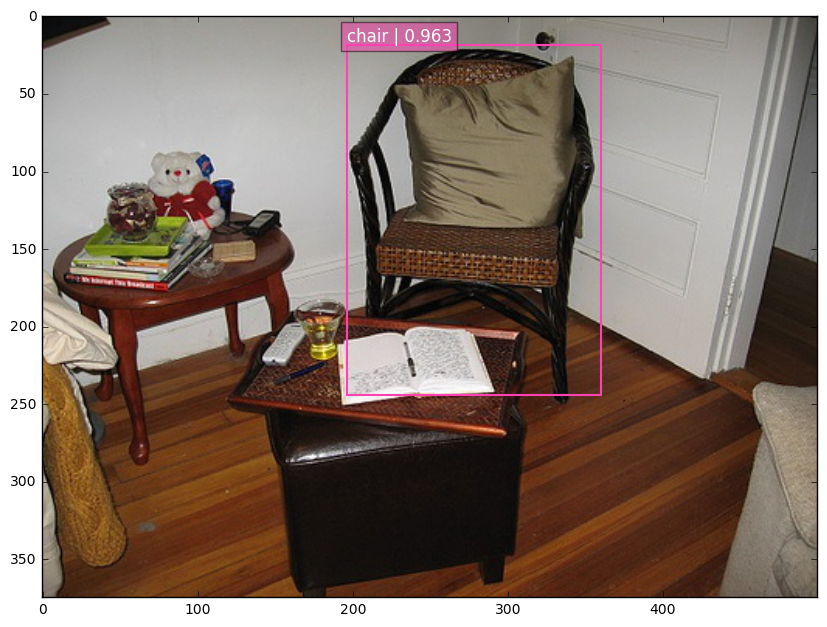

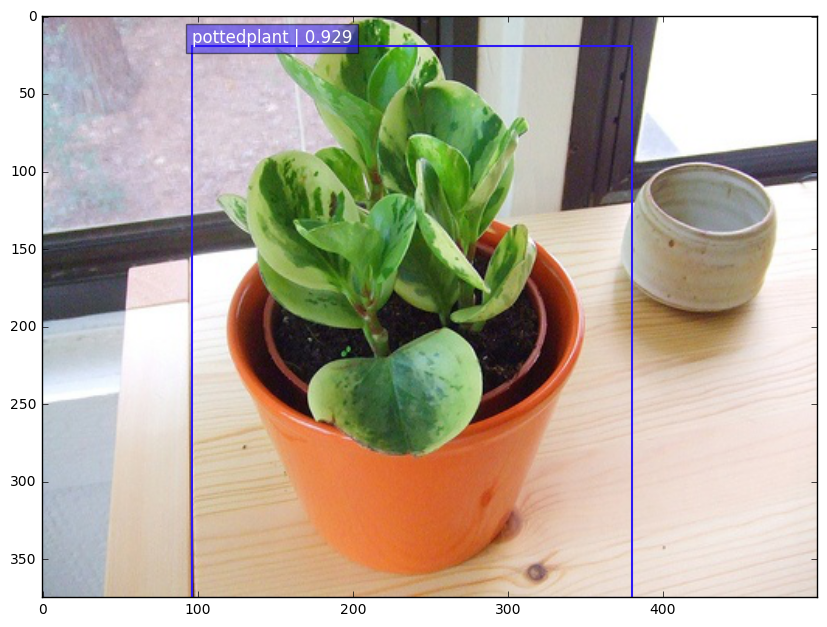

In [8]:
# Input placeholder.
net_shape = (300, 300)
data_format = 'NHWC'
img_input = tf.placeholder(tf.uint8, shape=(None, None, 3))
# Evaluation pre-processing: resize to SSD net shape.
image_pre, labels_pre, bboxes_pre, bbox_img = ssd_vgg_preprocessing.preprocess_for_eval(
    img_input, None, None, net_shape, data_format, resize=ssd_vgg_preprocessing.Resize.WARP_RESIZE)
image_4d = tf.expand_dims(image_pre, 0)

# Define the SSD model.
reuse = True if 'ssd_net' in locals() else None

from nets import ssd_vgg_300
from nets import ssd_vgg_300_subpixel
from nets import ssd_vgg_300_subpixel_pool

ssd_net = ssd_vgg_300.SSDNet()
#ssd_net = ssd_vgg_300_subpixel.SSDSubpixelNet()
#ssd_net = ssd_vgg_300_subpixel_pool.SSDSubpixelPoolNet()

with slim.arg_scope(ssd_net.arg_scope(data_format=data_format)):
    predictions, localisations, _, _ = ssd_net.net(image_4d, is_training=False, reuse=reuse)#, \
                                                   #subpixel = {'subpixel_r' : 2, 'desubpixel' : False})

# Restore SSD model.
#ckpt_filename = '../checkpoints/ssd_300_vgg.ckpt'
# caff
ckpt_path =   '/home/shhs/usr/detection/tf/SSD-Tensorflow/model/ssd/20170630-101121'
#ckpt_path = '../ssd_model/tf/ssd-300-caffe/VGG_VOC0712_SSD_300x300_iter_120000.ckpt'
#ckpt_path = '../ssd_model/tf/ssd-300-vgg-voc0712-coco/VGG_VOC0712_SSD_300x300_ft_iter_120000.ckpt/VGG_VOC0712_SSD_300x300_ft_iter_120000.ckpt'
# deconvolution
#ckpt_path = '../model/subpixel/20170606-162736'
#ckpt_path = '../model/subpixel_pool/20170605-093643/nocrop'
# subpixel
#ckpt_path = '../model/20170609-072244'
#ckpt_path = '../model/subpixel/l5e5'
if os.path.isdir(ckpt_path):
    ckpt_filename = tf.train.latest_checkpoint(ckpt_path)
else:
    ckpt_filename = ckpt_path  
# ckpt_filename = '../checkpoints/VGG_VOC0712_SSD_300x300_ft_iter_120000.ckpt'
isess.run(tf.global_variables_initializer())
saver = tf.train.Saver()
saver.restore(isess, ckpt_filename)

# SSD default anchor boxes.
ssd_anchors = ssd_net.anchors(net_shape)


# Main image processing routine.
def process_image(img, select_threshold=0.6, nms_threshold=.5, net_shape=(300, 300)):
    # Run SSD network.
    rimg, rpredictions, rlocalisations, rbbox_img = isess.run([image_4d, predictions, localisations, bbox_img],
                                                              feed_dict={img_input: img})
    
    # Get classes and bboxes from the net outputs.
    rclasses, rscores, rbboxes = np_methods.ssd_bboxes_select(
            rpredictions, rlocalisations, ssd_anchors,
            select_threshold=select_threshold, img_shape=net_shape, num_classes=21, decode=True)
    
    rbboxes = np_methods.bboxes_clip(rbbox_img, rbboxes)
    rclasses, rscores, rbboxes = np_methods.bboxes_sort(rclasses, rscores, rbboxes, top_k=400)
    rclasses, rscores, rbboxes = np_methods.bboxes_nms(rclasses, rscores, rbboxes, nms_threshold=nms_threshold)
    # Resize bboxes to original image shape. Note: useless for Resize.WARP!
    rbboxes = np_methods.bboxes_resize(rbbox_img, rbboxes)
    return rclasses, rscores, rbboxes

# Test on some demo image and visualize output.
path = '../demo/*.jpg'
import glob
image_names = sorted(glob.glob(path))
for img_file in image_names:
    #img = mpimg.imread(image_names[10])
    img = mpimg.imread(img_file)
    rclasses, rscores, rbboxes =  process_image(img)

    # visualization.bboxes_draw_on_img(img, rclasses, rscores, rbboxes, visualization.colors_plasma)
    visualization.plt_bboxes(img, rclasses, rscores, rbboxes)    


In [84]:
image_names

['../demo/13.jpg',
 '../demo/14.jpg',
 '../demo/8.jpg',
 '../demo/5.jpg',
 '../demo/0.jpg',
 '../demo/15.jpg',
 '../demo/7.jpg',
 '../demo/11.jpg',
 '../demo/3.jpg',
 '../demo/1.jpg',
 '../demo/12.jpg',
 '../demo/16.jpg',
 '../demo/4.jpg',
 '../demo/6.jpg',
 '../demo/2.jpg',
 '../demo/9.jpg',
 '../demo/10.jpg']

## Post-processing pipeline

The SSD outputs need to be post-processed to provide proper detections. Namely, we follow these common steps:

* Select boxes above a classification threshold;
* Clip boxes to the image shape;
* Apply the Non-Maximum-Selection algorithm: fuse together boxes whose Jaccard score > threshold;
* If necessary, resize bounding boxes to original image shape.

In [57]:
# Main image processing routine.
def process_image(img, select_threshold=0.5, nms_threshold=.1, net_shape=(300, 300)):
    # Run SSD network.
    rimg, rpredictions, rlocalisations, rbbox_img = isess.run([image_4d, predictions, localisations, bbox_img],
                                                              feed_dict={img_input: img})
    
    # Get classes and bboxes from the net outputs.
    rclasses, rscores, rbboxes = np_methods.ssd_bboxes_select(
            rpredictions, rlocalisations, ssd_anchors,
            select_threshold=select_threshold, img_shape=net_shape, num_classes=21, decode=True)
    
    rbboxes = np_methods.bboxes_clip(rbbox_img, rbboxes)
    rclasses, rscores, rbboxes = np_methods.bboxes_sort(rclasses, rscores, rbboxes, top_k=400)
    rclasses, rscores, rbboxes = np_methods.bboxes_nms(rclasses, rscores, rbboxes, nms_threshold=nms_threshold)
    # Resize bboxes to original image shape. Note: useless for Resize.WARP!
    rbboxes = np_methods.bboxes_resize(rbbox_img, rbboxes)
    return rclasses, rscores, rbboxes

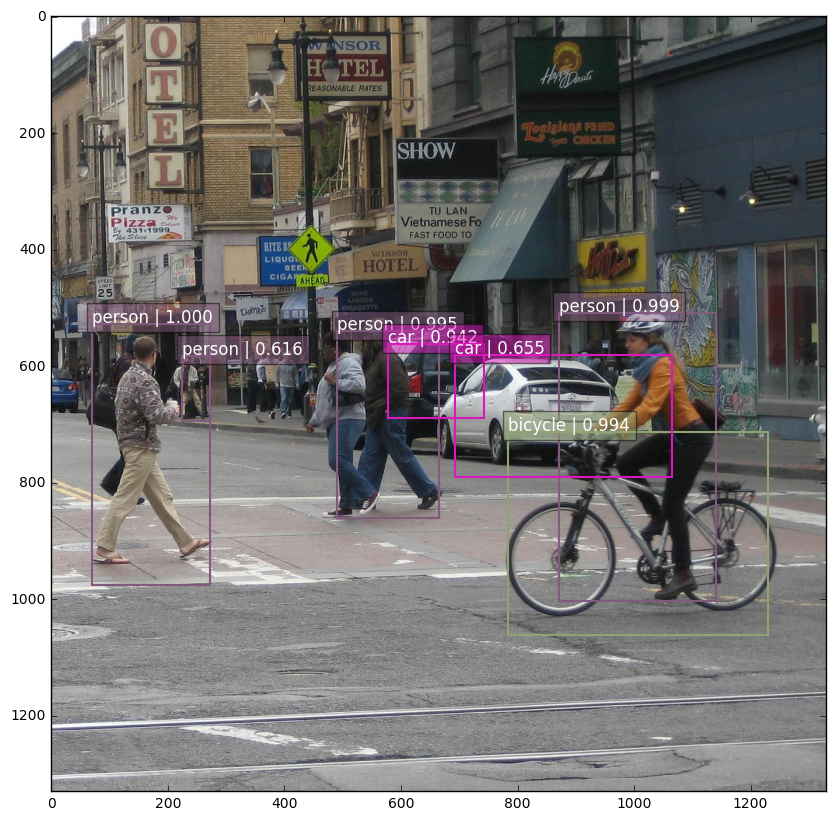

In [58]:
# Test on some demo image and visualize output.
path = '../demo/*.jpg'
import glob
image_names = sorted(glob.glob(path))

img = mpimg.imread(image_names[-2])
rclasses, rscores, rbboxes =  process_image(img)

# visualization.bboxes_draw_on_img(img, rclasses, rscores, rbboxes, visualization.colors_plasma)
visualization.plt_bboxes(img, rclasses, rscores, rbboxes)    


In [52]:
# Video demo
vidcap = cv2.VideoCapture(path + 'demo.mp4')
fourcc = cv2.VideoWriter_fourcc(*'XVID')
video = cv2.VideoWriter(path + 'output.avi',fourcc, 20.0, (640,480))
count = 0
ret = True
while ret:
    ret,image = vidcap.read()
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    cv2.imwrite(path + "frames/frame{0}.jpg".format(count), image) # save each frame as JPEG file   
    rclasses, rscores, rbboxes =  process_image(image)

    visualization.bboxes_draw_on_img(img, rclasses, rscores, rbboxes, visualization.colors_plasma)
    cv2.imwrite(path+ 'frames/frame{0}.jpg'.format(count), img) # comment this line if you don't want each frame saved
    cv2.flip(img,0)
    video.write(img)

    count += 1

# Release everything when job is done
vidcap.release()
video.release()

KeyboardInterrupt: 

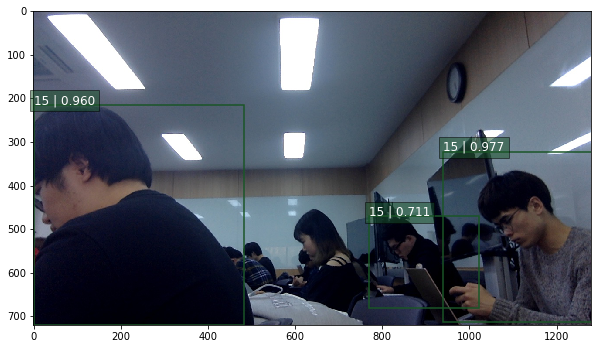

KeyboardInterrupt: 

In [53]:
# Live webcam demo
cap = cv2.VideoCapture(0)
while True:
    if not cap.isOpened():
        print('Failed to load camera.')
        sleep(5)
        pass
    # Capture frame-by-frame
    ret, frame = cap.read()
    # Save Recently captured frame as Jpeg file 
    cv2.imwrite(path + 'captured.jpg', frame)
    img = mpimg.imread(path + 'captured.jpg')
    
    rclasses, rscores, rbboxes =  process_image(img)

    # visualization.bboxes_draw_on_img(img, rclasses, rscores, rbboxes, visualization.colors_plasma)
    visualization.plt_bboxes(img, rclasses, rscores, rbboxes)

    
cap.release()
